# Pan-cancer (PC) plasma proteome Paper — Figure 1

This Jupyter Notebook (with Python 3 kernel) contained the code for cohort design, quality control and data distribution for the pan-cancer study

Input files:  
* The categorical clinical file: category.csv
* The continuous clinical fille: continuous.csv
* The PC proteome file: proteome.csv

Output figures:  
* Figure 1b, 1c, S1b, S1c, S1e

In [1]:
from utils import *
paths = ['../figure/figure1', '../documents/figure1']
for path in paths:
    if not os.path.isdir(path):
        os.makedirs(path)

a = Analysis('../')

In [3]:
import matplotlib.colors as mcolors

clinical_ = a.category.query("sample_annot.str.contains('discovery')&~`Sample type`.str.contains('benign')", engine='python')[['Sample type', 'System', 'TNM stage', 'Gender', 'Age']]
clinical_ = clinical_.sort_values(clinical_.columns.tolist())

fig, ax = plt.subplots(figsize=(6, 4),subplot_kw=dict(projection='polar'))
ax.grid(False)
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.spines['polar'].set_visible(False)

clinical_heatmap = clinical_.iloc[:, :-1].fillna('NA')
n = clinical_heatmap.shape[0]
for i, label in enumerate(clinical_heatmap.columns):
    rad = np.linspace(9.5-i, 10-i, 2)
    ra = np.linspace(np.pi/2, 9/4 * np.pi, n)
    r, th = np.meshgrid(rad, ra)
    clinical_tmp = clinical_heatmap[label]
    categorical_ = pd.Categorical(clinical_tmp)
    z = np.repeat(categorical_.codes[:, None], repeats=2, axis=1)
    mapping_ = dict(zip(pd.unique(categorical_.codes), categorical_.categories))
    color_mapping_ = {k: a._color_map[label].get(v, 'lightgrey') for k, v in mapping_.items()}
    cmap = mcolors.ListedColormap([color_mapping_[i] for i in pd.unique(categorical_.codes)])
    im = ax.pcolormesh(th, r, z, cmap=cmap)
    count = len(mapping_)
    cbar = fig.colorbar(im, ax=ax, aspect=count, fraction=(1/count), shrink=.04*count, pad=0.05)
    cbar.ax.set_yticks(np.linspace(0, count-1, count+1)[:-1]+(count-1)/(2*count))
    cbar.ax.set_yticklabels(list(mapping_.values()))
    cbar.ax.set_title(label)

age = clinical_['Age'].fillna(0).values / 18
width = 7 * np.pi / (4 * n)
colors = ['red'] * n
ax.bar(x=ra, height=age, width=width, bottom=0, color=colors, alpha=0.5)
fig.savefig('../figure/figure1/Fig1b.pdf', bbox_inches='tight')

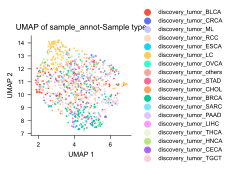

In [12]:
tumor_types = a.category['Sample type'].dropna().unique()
tumor_types = [i for i in tumor_types if 'benign' not in i if i != 'normal']
a.set_param('group', dataset_type='proteome', group_name=['sample_annot', 'Sample type'], part_element=[['discovery_tumor'], tumor_types], param_method='mean', thresh=.8)
plotdata, ax = a.decomposition(transform='log2', scatter_kwargs={'s': 3}, return_pca=True, method='umap')
ax.get_figure().savefig('../figure/figure1/Fig1c.pdf', bbox_inches='tight')
plotdata.to_csv('../documents/figure1/Source_data_Fig1c.csv')

In [407]:
from utils.statistic import core_corr

fig, axs = plt.subplots(1, 3, figsize=(9.4, 3))
plt.subplots_adjust(wspace=.2)
data_names = ['dda_qc', 'dia_qc', 'dia_qc_val']
names = ['HEK293T', 'plasma mixture', 'plasma mixture validation']
for data_name, name, ax in zip(data_names, names, axs):
    data = a._data[data_name].pipe(np.log10)
    corr_value = {}
    samples = data.columns
    matrix1_value = data.T

    for sample in samples:
        matrix2_value = data.loc[:, sample]
        corr_ = core_corr(matrix1_value, matrix2_value, method='pearson')[2][0]
        corr_value[sample] = corr_

    corr_df = pd.DataFrame(np.vstack(corr_value.values()), columns=samples, index=samples)
    corr_df.to_csv('../documents/figure1/Source_data_FigS1b_{}.csv'.format(name))
    mask = np.triu(np.ones_like(corr_df, dtype=bool))
    annot = (corr_df * mask).replace(1, np.nan).replace(0, np.nan).applymap('{:.2f}'.format).replace('nan', '')
    heatmap(corr_df, vmax=1, vmin=.5, center=.75, cmap=R_CMAP, square=True, yticklabels=False, mask=mask, linewidth=.1, linecolor='black', annot=annot, fmt='', cbar_kws={'shrink': .3, 'label': 'Correlation\ncoefficient'}, ax=ax)
    n = corr_df.shape[0]
    for i in range(1, n):
        for j in range(i+1, n+1):
            ax.text(j-0.9, i-0.4, annot.iloc[i-1, j-1], fontsize=.8)
    ax.set_title("pearson's correlation coefficients of\n{} QC standards".format(name))
fig.savefig('../figure/figure1/FigS1b.pdf', bbox_inches='tight')

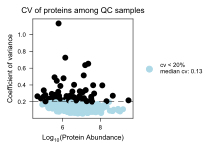

In [6]:
cv = a.dia_qc.std(axis=1) / a.dia_qc.mean(axis=1)
qc_abundance = a.dia_qc.mean(axis=1).pipe(np.log10)
plotdata = pd.concat([qc_abundance.rename('$\mathregular{Log_{10}}$(Protein Abundance)'), cv.rename('Coefficient of variance')], axis=1)
plotdata.loc[plotdata['Coefficient of variance']<.2, 'annot'] = 'cv < 20%\nmedian cv: {:.2f}'.format(plotdata.loc[:, 'Coefficient of variance'].median())
plotdata.loc[:, 'annot'] = plotdata.loc[:, 'annot'].fillna('')
plotdata.to_csv('../documents/figure1/Source_data_FigS1c.csv')

ax = scatterplot(plotdata.iloc[:, [0, 2, 1]], ticklabels_hide=[], ticklabels_format=[], title='CV of proteins among QC samples', spines_hide=[], palette=['black', 'lightblue'])
ax.axhline(y=.2, c="black", ls="--", dashes=(11, 8), lw=0.5)
ax.get_figure().savefig('../figure/figure1/FigS1c.pdf', bbox_inches='tight')

In [2]:
from utils.algorithm import core_PCA
from sklearn.preprocessing import StandardScaler
from functools import reduce 
from collections import defaultdict
from utils.statistic import core_corr, pearson_pvalue, spearman_pvalue

def rec_dd():
    return defaultdict(rec_dd)

def calculate_brinfo(a_, b_, batch, method='pearson'):
    out = core_corr(batch.values[None, :], a_.T, method=method)
    corr_ = out[2][0]
    ddof = out[1][0]
    if method == 'pearson':
        pvalue_ = pearson_pvalue(corr_, ddof)
    else:
        pvalue_ = pearson_pvalue(corr_, ddof)
    out_df = pd.DataFrame(np.vstack((corr_, pvalue_, b_)).T, columns=['statistic', 'pvlaue', 'ev'])
    brinfo = np.sum(np.abs(corr_ * b_))
    return out_df, brinfo

n = 1000
caches_ = rec_dd()
columns = ['sample_collect_year', 'discovery_cohort_preparation', 'discovery_cohort_MS-detection', 'temperature', 'humidity', 'pressure']
tumor_types = ['BLCA', 'CRCA', 'ML', 'RCC', 'ESCA', 'LC', 'OVCA', 'STAD', 'CHOL', 'BRCA', 'SARC', 'PAAD', 'LIHC', 'THCA', 'HNCA', 'CECA', 'TGCT']
for column in columns:
    for tumor_type in tumor_types:
        pre_batch = a.category.query("`Sample type`==@tumor_type")[column].dropna()
        sample = reduce(np.intersect1d, (pre_batch.index, a.proteome.columns))
        batch = pre_batch.loc[sample]
        data = dropnan(a.proteome.loc[:, sample], thresh=.8).fillna(1)
        if data.shape[1] < 10 or batch.unique().shape[0] == 1:
            continue
        a_, b_ = core_PCA(StandardScaler().fit_transform(data.T))
        _, batch_information = calculate_brinfo(a_, b_, batch, method='pearson')

        caches_[column]['pca_'] = a_
        caches_[column]['ev_ratio'] = b_
        caches_[column]['brinfo'][tumor_type]['actual'] = batch_information

        shuffle_sample = np.array(batch.index)
        for random_state in range(1, n, 1):
            np.random.seed(random_state)
            np.random.shuffle(shuffle_sample)
            batch.index = shuffle_sample

            _, batch_information = calculate_brinfo(a_, b_, batch.loc[data.columns], method='pearson')
            caches_[column]['brinfo'][tumor_type][random_state] = batch_information

annot_pvalues = {}
for k, v in caches_.items():
    pvalues = []
    for k1, v1 in v['brinfo'].items():
        value_ = np.array(list(v1.values()))
        pvalue = (n - np.argwhere(np.sort(value_)==value_[0])[0][0]) / n
        pvalues.append(pvalue)
    annot_pvalues[k] = np.mean(pvalues)

In [3]:
mapping_dict = dict(zip(columns, ['Blood sample collection', 'Sample preparation', 'MS detection', 'Temperature', 'Humidity', 'Pressure of the nitrogen cylinder']))
fig, axs = plt.subplots(3, 2, figsize=(8, 5.5))
plt.subplots_adjust(wspace=.4, hspace=.5)
for column, ax in zip(columns, axs.ravel()):
    pre_batch = a.category[column].dropna()
    sample = reduce(np.intersect1d, (pre_batch.index, a.proteome.columns))
    batch = pre_batch.loc[sample]
    data = a.proteome.loc[:, sample].dropna(how='all').fillna(1)
    a_, b_ = core_PCA(StandardScaler().fit_transform(data.T))
    out_df, batch_information = calculate_brinfo(a_, b_, batch, method='pearson')

    df = out_df.rename_axis('Principal component').rename(index=lambda x: x+1).reset_index()
    df.loc[(df['statistic']>.3)|(df['statistic']<-.3), 'annot'] = 'Pearson corr > 0.3 or < -0.3'
    df.loc[:, 'annot'] = df.loc[:, 'annot'].fillna('others')
    # display(', '.join(('PC'+df.query("annot!='others'")['Principal component'].astype(str)).values), df.shape)
    ax_twin = ax.twinx()

    palette=['lightblue', 'orange']
    if df['annot'].nunique() == 1:
        palette = ['orange']

    barplot(df.iloc[:, [0, -1, 1]].sort_values('annot'), ax=ax, ticklabels_format=[], ticklabels_hide=[], palette=palette)
    ax.set_xticks(range(100, 1001, 100))
    ax.set_xticklabels(range(100, 1001, 100))
    ax.set_ylabel('Pearson correlation')
    ax.legend(loc='upper center')

    plotdata = df.iloc[:, [0, 3]]
    plotdata.iloc[:, 0] = plotdata.iloc[:, 0] - 1
    ax_twin = scatterplot(plotdata, ax=ax_twin, color='black', s=1, ticklabels_format=[], ticklabels_hide=[], spines_hide=[], title='PCA for {} batch effects'.format(mapping_dict.get(column)))
    ax_twin.set_ylabel('Explain ratio')
    ax_twin.text(x=ax_twin.get_xlim()[1]*0.5, y=ax_twin.get_ylim()[1]*0.5, s='Batch related information of\nthe proteomic data: {:.2%}'.format(batch_information))
    ax_twin.text(x=ax_twin.get_xlim()[1]*0.5, y=ax_twin.get_ylim()[1]*0.2, s='p-value: {:.2f}'.format(annot_pvalues[column]))

    df.to_csv('../documents/figure1/{}_PCA-based_table.csv'.format(column))
fig.savefig('../figure/figure1/FigS1e.pdf', bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
